In [1]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import LabelEncoder
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as pe
plt.rcParams['figure.figsize'] = (8, 5)
plt.rcParams['figure.dpi'] = 250
%matplotlib inline
import warnings
warnings.filterwarnings(action= 'ignore')

In [2]:
df = pd.read_csv("https://raw.githubusercontent.com/PrathameshR10/Assignments/main/Folder/EastWestAirlines.csv",index_col=0)

In [3]:
df

,Balance,Qual_miles,cc1_miles,cc2_miles,cc3_miles,Bonus_miles,Bonus_trans,Flight_miles_12mo,Flight_trans_12,Days_since_enroll,Award?
ID#,,,,,,,,,,,
1,28143,0,1,1,1,174,1,0,0,7000,0
2,19244,0,1,1,1,215,2,0,0,6968,0
3,41354,0,1,1,1,4123,4,0,0,7034,0
4,14776,0,1,1,1,500,1,0,0,6952,0
5,97752,0,4,1,1,43300,26,2077,4,6935,1
...,...,...,...,...,...,...,...,...,...,...,...
4017,18476,0,1,1,1,8525,4,200,1,1403,1
4018,64385,0,1,1,1,981,5,0,0,1395,1
4019,73597,0,3,1,1,25447,8,0,0,1402,1


In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 3999 entries, 1 to 4021
Data columns (total 11 columns):
 #   Column             Non-Null Count  Dtype
---  ------             --------------  -----
 0   Balance            3999 non-null   int64
 1   Qual_miles         3999 non-null   int64
 2   cc1_miles          3999 non-null   int64
 3   cc2_miles          3999 non-null   int64
 4   cc3_miles          3999 non-null   int64
 5   Bonus_miles        3999 non-null   int64
 6   Bonus_trans        3999 non-null   int64
 7   Flight_miles_12mo  3999 non-null   int64
 8   Flight_trans_12    3999 non-null   int64
 9   Days_since_enroll  3999 non-null   int64
 10  Award?             3999 non-null   int64
dtypes: int64(11)
memory usage: 374.9 KB


In [5]:
df.describe()

,Balance,Qual_miles,cc1_miles,cc2_miles,cc3_miles,Bonus_miles,Bonus_trans,Flight_miles_12mo,Flight_trans_12,Days_since_enroll,Award?
count,3.999000e+03,3999.000000,3999.000000,3999.000000,3999.000000,3999.000000,3999.00000,3999.000000,3999.000000,3999.00000,3999.000000
mean,7.360133e+04,144.114529,2.059515,1.014504,1.012253,17144.846212,11.60190,460.055764,1.373593,4118.55939,0.370343
std,1.007757e+05,773.663804,1.376919,0.147650,0.195241,24150.967826,9.60381,1400.209171,3.793172,2065.13454,0.482957
min,0.000000e+00,0.000000,1.000000,1.000000,1.000000,0.000000,0.00000,0.000000,0.000000,2.00000,0.000000
25%,1.852750e+04,0.000000,1.000000,1.000000,1.000000,1250.000000,3.00000,0.000000,0.000000,2330.00000,0.000000
50%,4.309700e+04,0.000000,1.000000,1.000000,1.000000,7171.000000,12.00000,0.000000,0.000000,4096.00000,0.000000
75%,9.240400e+04,0.000000,3.000000,1.000000,1.000000,23800.500000,17.00000,311.000000,1.000000,5790.50000,1.000000
max,1.704838e+06,11148.000000,5.000000,3.000000,5.000000,263685.000000,86.00000,30817.000000,53.000000,8296.00000,1.000000


In [6]:
df.duplicated().sum()

1

In [7]:
df[df.duplicated(keep=False)]

,Balance,Qual_miles,cc1_miles,cc2_miles,cc3_miles,Bonus_miles,Bonus_trans,Flight_miles_12mo,Flight_trans_12,Days_since_enroll,Award?
ID#,,,,,,,,,,,
3393,1000,0,1,1,1,0,0,0,0,1597,0
3899,1000,0,1,1,1,0,0,0,0,1597,0


In [8]:
df.drop_duplicates(inplace=True)

In [9]:
df.duplicated().sum()

0

In [10]:
df['Award?'].unique()    # Categorical Column

array([0, 1], dtype=int64)

In [11]:
pe.box(df)

In [12]:
df.describe()

,Balance,Qual_miles,cc1_miles,cc2_miles,cc3_miles,Bonus_miles,Bonus_trans,Flight_miles_12mo,Flight_trans_12,Days_since_enroll,Award?
count,3.998000e+03,3998.000000,3998.00000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000
mean,7.361949e+04,144.150575,2.05978,1.014507,1.012256,17149.134567,11.604802,460.170835,1.373937,4119.190095,0.370435
std,1.007817e+05,773.757220,1.37699,0.147669,0.195265,24152.465996,9.603258,1400.365407,3.793585,2065.007629,0.482982
min,0.000000e+00,0.000000,1.00000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,2.000000,0.000000
25%,1.853425e+04,0.000000,1.00000,1.000000,1.000000,1250.000000,3.000000,0.000000,0.000000,2331.250000,0.000000
50%,4.313800e+04,0.000000,1.00000,1.000000,1.000000,7183.000000,12.000000,0.000000,0.000000,4097.500000,0.000000
75%,9.240500e+04,0.000000,3.00000,1.000000,1.000000,23810.750000,17.000000,313.500000,1.000000,5790.750000,1.000000
max,1.704838e+06,11148.000000,5.00000,3.000000,5.000000,263685.000000,86.000000,30817.000000,53.000000,8296.000000,1.000000


In [14]:
df['Qual_miles'].value_counts()

0       3772
1000      17
500       15
967        4
888        4
        ... 
4116       1
1388       1
1896       1
3692       1
1005       1
Name: Qual_miles, Length: 164, dtype: int64

In [15]:
# In Qual_miles column single value i.e. '0' is overwhelmingly dominant with 3773 out of 3999 data points.
# rest of the values contribute very less to the data, and might add noise to our model
# Capping method to remove outliers will bring variance of this column to zero.
# and log transformation will not work because log of zero is invalid and majority of our values counts is zero.
# Considering all these points we will drop this column from our dataset

In [16]:
df.drop(columns='Qual_miles',inplace=True)

In [17]:
df['cc3_miles_binned'] = df['cc3_miles'].apply(lambda x: '2+' if x > 1 else '1')
df['cc2_miles_binned'] = df['cc2_miles'].apply(lambda x: '2+' if x > 1 else '1')

In [18]:
df.drop(columns='cc3_miles',inplace=True)
df.drop(columns='cc2_miles',inplace=True)
df

,Balance,cc1_miles,Bonus_miles,Bonus_trans,Flight_miles_12mo,Flight_trans_12,Days_since_enroll,Award?,cc3_miles_binned,cc2_miles_binned
ID#,,,,,,,,,,
1,28143,1,174,1,0,0,7000,0,1,1
2,19244,1,215,2,0,0,6968,0,1,1
3,41354,1,4123,4,0,0,7034,0,1,1
4,14776,1,500,1,0,0,6952,0,1,1
5,97752,4,43300,26,2077,4,6935,1,1,1
...,...,...,...,...,...,...,...,...,...,...
4017,18476,1,8525,4,200,1,1403,1,1,1
4018,64385,1,981,5,0,0,1395,1,1,1
4019,73597,3,25447,8,0,0,1402,1,1,1


In [19]:
x = pd.get_dummies(df, columns=['Award?','cc3_miles_binned','cc2_miles_binned'], drop_first=True)
x

,Balance,cc1_miles,Bonus_miles,Bonus_trans,Flight_miles_12mo,Flight_trans_12,Days_since_enroll,Award?_1,cc3_miles_binned_2+,cc2_miles_binned_2+
ID#,,,,,,,,,,
1,28143,1,174,1,0,0,7000,0,0,0
2,19244,1,215,2,0,0,6968,0,0,0
3,41354,1,4123,4,0,0,7034,0,0,0
4,14776,1,500,1,0,0,6952,0,0,0
5,97752,4,43300,26,2077,4,6935,1,0,0
...,...,...,...,...,...,...,...,...,...,...
4017,18476,1,8525,4,200,1,1403,1,0,0
4018,64385,1,981,5,0,0,1395,1,0,0
4019,73597,3,25447,8,0,0,1402,1,0,0


In [20]:
from sklearn.preprocessing import StandardScaler

In [21]:
sc = StandardScaler()
dfs = sc.fit_transform(x)

In [22]:
dfs = pd.DataFrame(dfs, columns=df.columns)
dfs

,Balance,cc1_miles,Bonus_miles,Bonus_trans,Flight_miles_12mo,Flight_trans_12,Days_since_enroll,Award?,cc3_miles_binned,cc2_miles_binned
0,-0.451294,-0.769732,-0.702920,-1.104430,-0.328649,-0.362219,1.395235,-0.767072,-0.06725,-0.10427
1,-0.539605,-0.769732,-0.701223,-1.000286,-0.328649,-0.362219,1.379736,-0.767072,-0.06725,-0.10427
2,-0.320192,-0.769732,-0.539397,-0.791997,-0.328649,-0.362219,1.411702,-0.767072,-0.06725,-0.10427
3,-0.583944,-0.769732,-0.689421,-1.104430,-0.328649,-0.362219,1.371987,-0.767072,-0.06725,-0.10427
4,0.239483,1.409207,1.082876,1.499179,1.154721,0.692324,1.363754,1.303659,-0.06725,-0.10427
...,...,...,...,...,...,...,...,...,...,...
3993,-0.547226,-0.769732,-0.357115,-0.791997,-0.185811,-0.098583,-1.315506,1.303659,-0.06725,-0.10427
3994,-0.091640,-0.769732,-0.669503,-0.687853,-0.328649,-0.362219,-1.319381,1.303659,-0.06725,-0.10427
3995,-0.000223,0.682894,0.343605,-0.375420,-0.328649,-0.362219,-1.315990,1.303659,-0.06725,-0.10427
3996,-0.185776,-0.769732,-0.689421,-1.104430,0.028446,-0.098583,-1.316475,-0.767072,-0.06725,-0.10427


In [23]:
dfs['cc3_miles_binned'].value_counts()

-0.067250     3980
 14.869805      18
Name: cc3_miles_binned, dtype: int64

In [24]:
dfs['cc2_miles_binned'].value_counts()

-0.104270    3955
 9.590451      43
Name: cc2_miles_binned, dtype: int64

In [25]:
dfs.drop(columns=['cc2_miles_binned','cc3_miles_binned'],inplace=True)
dfs

,Balance,cc1_miles,Bonus_miles,Bonus_trans,Flight_miles_12mo,Flight_trans_12,Days_since_enroll,Award?
0,-0.451294,-0.769732,-0.702920,-1.104430,-0.328649,-0.362219,1.395235,-0.767072
1,-0.539605,-0.769732,-0.701223,-1.000286,-0.328649,-0.362219,1.379736,-0.767072
2,-0.320192,-0.769732,-0.539397,-0.791997,-0.328649,-0.362219,1.411702,-0.767072
3,-0.583944,-0.769732,-0.689421,-1.104430,-0.328649,-0.362219,1.371987,-0.767072
4,0.239483,1.409207,1.082876,1.499179,1.154721,0.692324,1.363754,1.303659
...,...,...,...,...,...,...,...,...
3993,-0.547226,-0.769732,-0.357115,-0.791997,-0.185811,-0.098583,-1.315506,1.303659
3994,-0.091640,-0.769732,-0.669503,-0.687853,-0.328649,-0.362219,-1.319381,1.303659
3995,-0.000223,0.682894,0.343605,-0.375420,-0.328649,-0.362219,-1.315990,1.303659
3996,-0.185776,-0.769732,-0.689421,-1.104430,0.028446,-0.098583,-1.316475,-0.767072


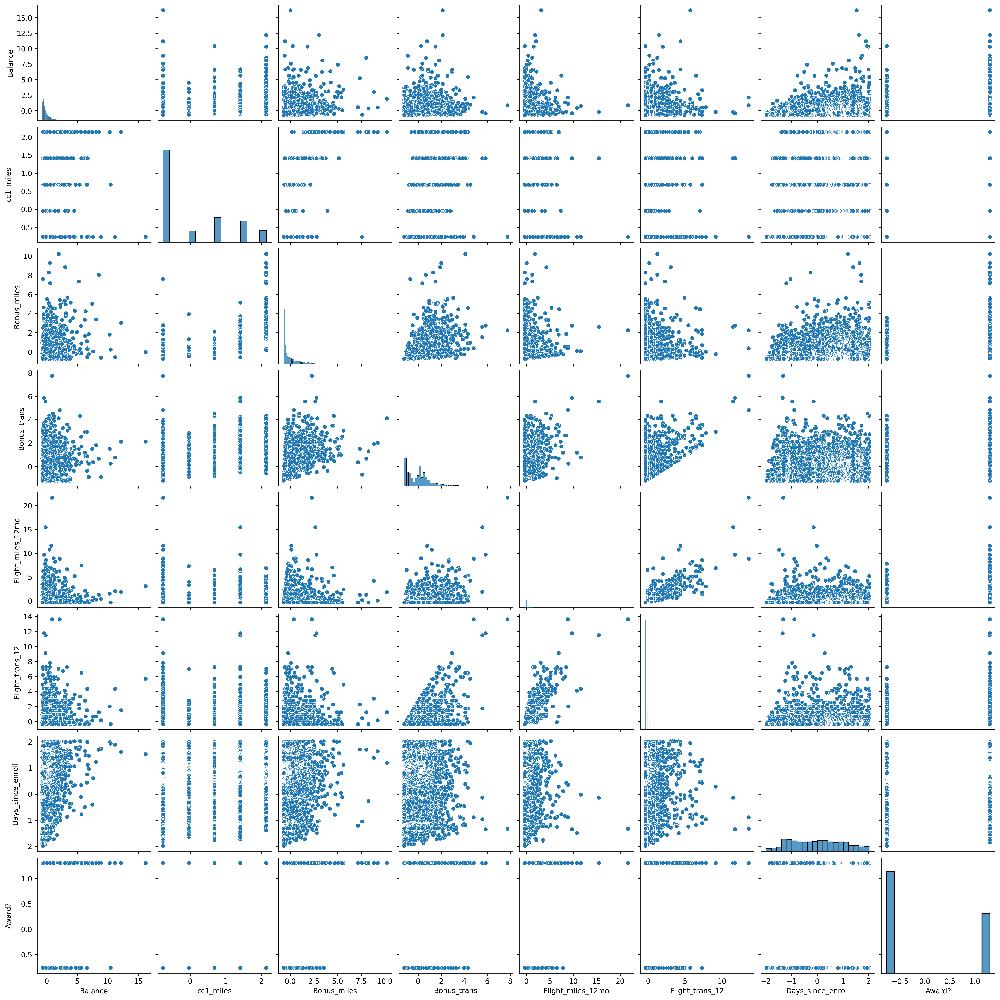

In [26]:
sns.pairplot(dfs)

<Axes: xlabel='Flight_miles_12mo', ylabel='Flight_trans_12'>

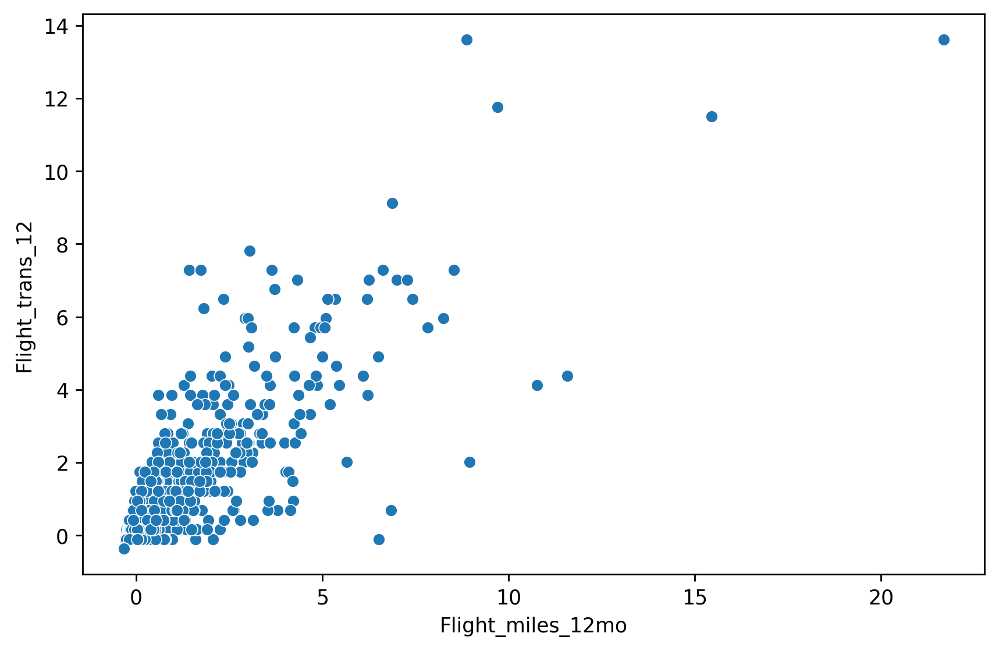

In [27]:
sns.scatterplot(x = dfs['Flight_miles_12mo'], y= dfs['Flight_trans_12'])

<Axes: >

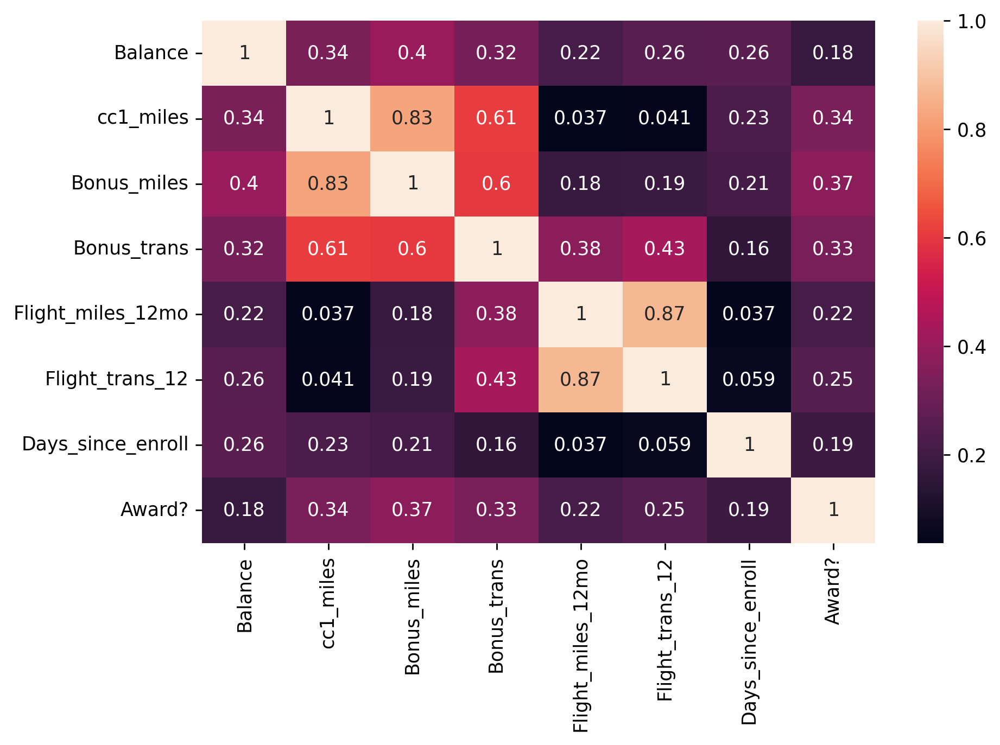

In [28]:
sns.heatmap(dfs.corr(),annot=True)

In [29]:
# Insights:-

#High Positive Correlations:

# Bonus_miles and cc1_miles (0.83): Strong positive correlation suggests that 
    # customers who earn more miles with the frequent flyer credit card also tend to earn more bonus miles.


# Flight_miles_12mo and Flight_trans_12 (0.87): Strong positive correlation indicates that 
    # customers who have more flight miles in the past year also have more flight transactions.


# Bonus_trans and cc1_miles (0.61): Customers with more non-flight bonus transactions also tend to earn more miles 
    # with the frequent flyer credit card.
    
# Bonus_trans and Bonus_miles(0.6): Their is also positive correlation suggesting that customers with more number of 
    # non flight transactions have more bonus miles earned from those non flight transactions.

## Model Building

### 1.Hierarchical Clustering

In [30]:
from scipy.cluster import hierarchy

#### 1.Single Linkage Method

In [31]:
#lk = hierarchy.linkage(dfs, method='single')
# dendrogram = hierarchy.dendrogram(lk)
#plt.axhline(y = 7, linestyle = '--', color = 'red')

#### 2.Complete Linkage Method

In [32]:
#lk1 = hierarchy.linkage(dfs, method='complete')
#dendrogram1 = hierarchy.dendrogram(lk1)
#plt.axhline(y = 30, linestyle = '--', color = 'red')

In [33]:
from sklearn.cluster import AgglomerativeClustering

In [34]:
hc = AgglomerativeClustering(n_clusters=2)
y_pred = hc.fit_predict(dfs)
y_pred

array([1, 1, 1, ..., 0, 1, 1], dtype=int64)

In [35]:
dfs['Cluster'] = y_pred
dfs

,Balance,cc1_miles,Bonus_miles,Bonus_trans,Flight_miles_12mo,Flight_trans_12,Days_since_enroll,Award?,Cluster
0,-0.451294,-0.769732,-0.702920,-1.104430,-0.328649,-0.362219,1.395235,-0.767072,1
1,-0.539605,-0.769732,-0.701223,-1.000286,-0.328649,-0.362219,1.379736,-0.767072,1
2,-0.320192,-0.769732,-0.539397,-0.791997,-0.328649,-0.362219,1.411702,-0.767072,1
3,-0.583944,-0.769732,-0.689421,-1.104430,-0.328649,-0.362219,1.371987,-0.767072,1
4,0.239483,1.409207,1.082876,1.499179,1.154721,0.692324,1.363754,1.303659,0
...,...,...,...,...,...,...,...,...,...
3993,-0.547226,-0.769732,-0.357115,-0.791997,-0.185811,-0.098583,-1.315506,1.303659,0
3994,-0.091640,-0.769732,-0.669503,-0.687853,-0.328649,-0.362219,-1.319381,1.303659,0
3995,-0.000223,0.682894,0.343605,-0.375420,-0.328649,-0.362219,-1.315990,1.303659,0
3996,-0.185776,-0.769732,-0.689421,-1.104430,0.028446,-0.098583,-1.316475,-0.767072,1


In [36]:
dfs.groupby(dfs['Cluster']).agg('mean')

,Balance,cc1_miles,Bonus_miles,Bonus_trans,Flight_miles_12mo,Flight_trans_12,Days_since_enroll,Award?
Cluster,,,,,,,,
0,0.336401,0.545977,0.564028,0.501487,0.284650,0.327399,0.253047,1.065730
1,-0.241567,-0.392062,-0.405024,-0.360114,-0.204405,-0.235103,-0.181711,-0.765292


<Axes: xlabel='Flight_trans_12', ylabel='Flight_miles_12mo'>

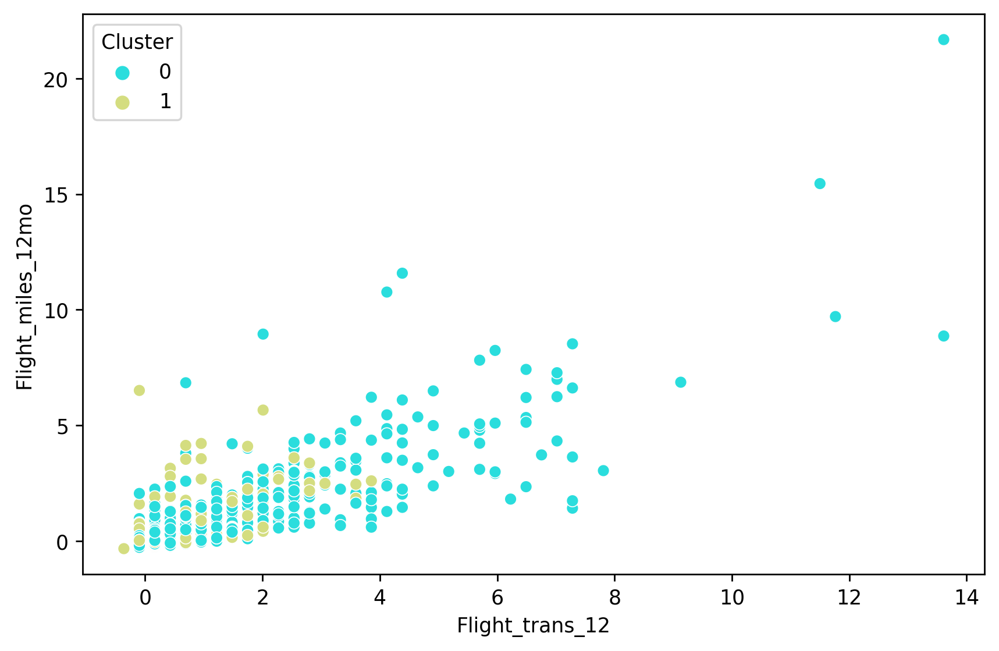

In [37]:
sns.scatterplot(x = dfs['Flight_trans_12'],y = dfs['Flight_miles_12mo'], hue=dfs['Cluster'],palette='rainbow')

### 2.K-Means

In [38]:
from sklearn.cluster import KMeans
km = KMeans()

In [39]:
yk = km.fit_predict(dfs)

In [40]:
len(yk)

3998

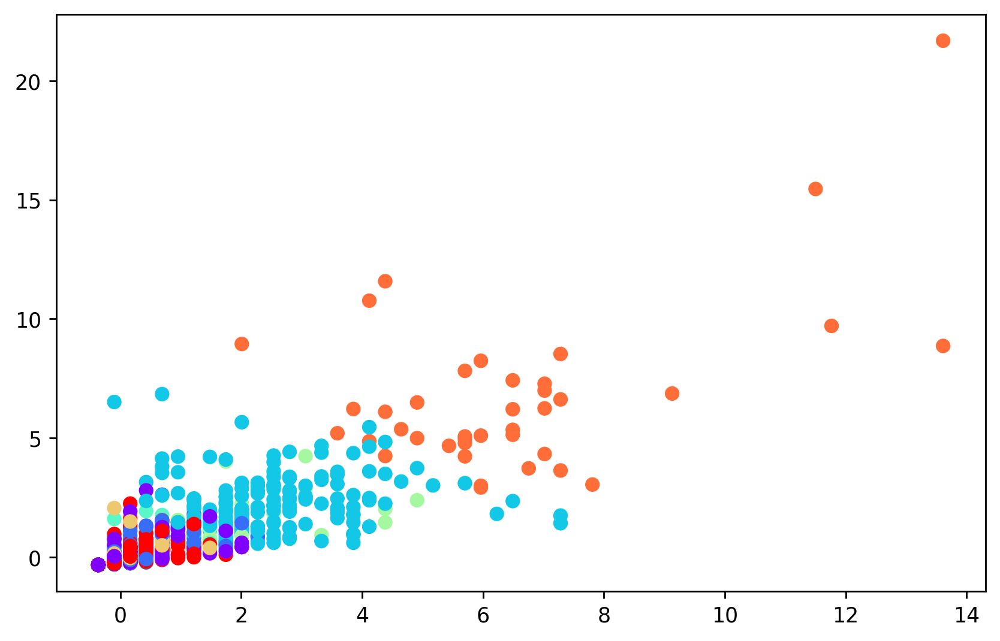

In [41]:
plt.scatter(x = dfs['Flight_trans_12'],y = dfs['Flight_miles_12mo'],c = yk, cmap='rainbow')

#### Elbow Graph

In [42]:
wcss = []

for i in range(1,11):
    km = KMeans(n_clusters=i)
    km.fit_predict(dfs)
    wcss.append(km.inertia_)

In [43]:
wcss

[32956.59054527264,
 24054.41036137962,
 19659.256955221994,
 16914.865647278424,
 15271.604796040752,
 13885.91947261289,
 12614.77583135941,
 11574.530355619489,
 10768.497688036317,
 10222.935034110053]

Text(0.5, 1.0, 'Elbow Graph')

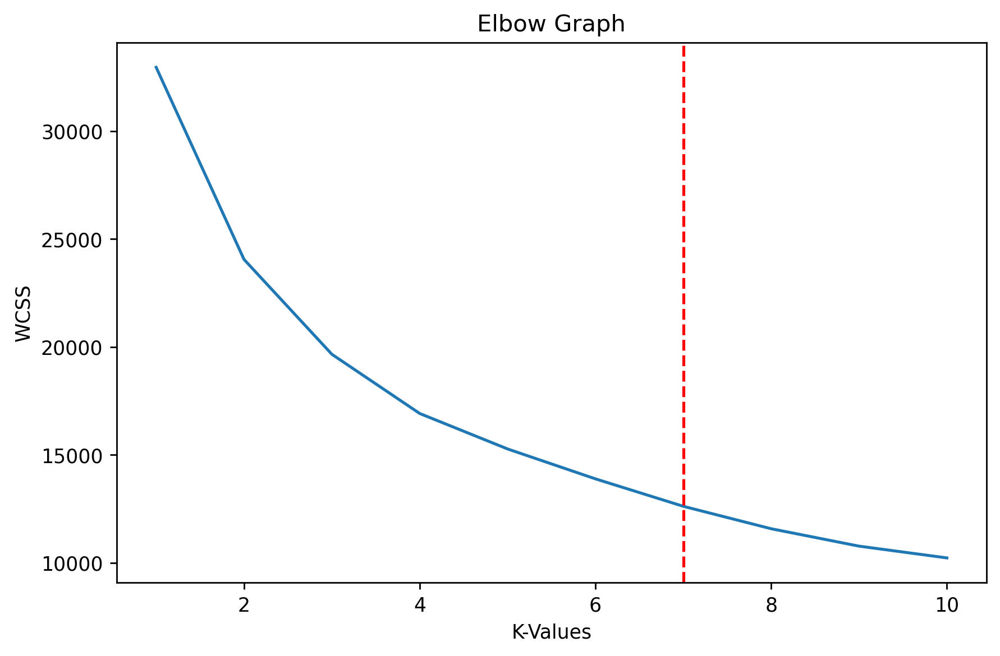

In [44]:
plt.plot(range(1,11),wcss)
plt.axvline(x = 7, linestyle = '--', color = 'red')
plt.xlabel('K-Values')
plt.ylabel('WCSS')
plt.title('Elbow Graph')

In [45]:
km1 = KMeans(n_clusters=7)
ypred1 = km.fit_predict(dfs)
ypred1

array([6, 6, 6, ..., 7, 0, 0])

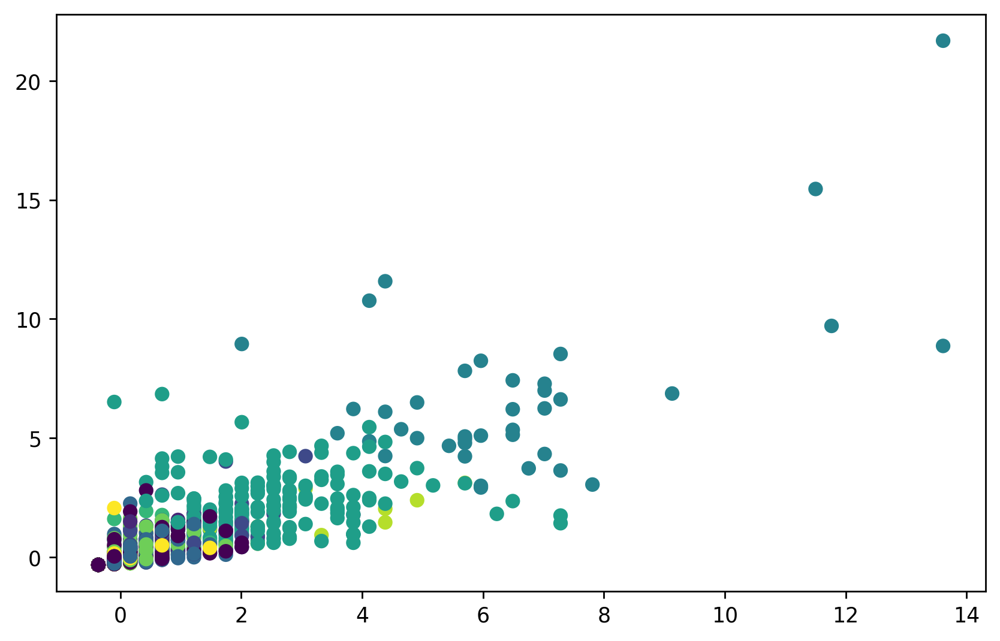

In [46]:
plt.scatter(x = dfs['Flight_trans_12'],y = dfs['Flight_miles_12mo'],c = ypred1, cmap='viridis')

In [47]:
from sklearn.metrics import silhouette_score
silhouette_score(dfs,ypred1)

0.2803063806868856

### 3.DBSCAN

In [48]:
from sklearn.cluster import DBSCAN

In [49]:
db = DBSCAN(eps=0.5, min_samples=5)

y2 = db.fit_predict(dfs)

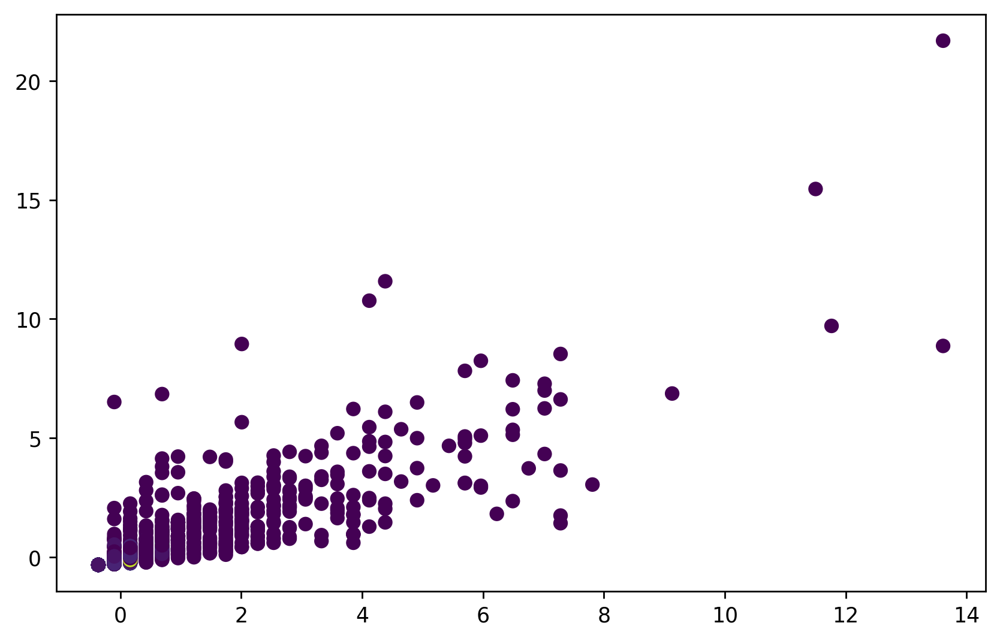

In [50]:
plt.scatter(x = dfs['Flight_trans_12'],y = dfs['Flight_miles_12mo'],c = y2, cmap='viridis')

In [51]:
from sklearn.neighbors import NearestNeighbors
neigh = NearestNeighbors(n_neighbors=3).fit(dfs)
d,index = neigh.kneighbors(dfs)
pd.DataFrame(d)

,0,1,2
0,0.0,0.111852,0.120336
1,0.0,0.114067,0.114382
2,0.0,0.165401,0.194584
3,0.0,0.048377,0.058576
4,0.0,0.545494,0.735073
...,...,...,...
3993,0.0,0.288927,0.335125
3994,0.0,0.232717,0.312813
3995,0.0,0.166144,0.280241
3996,0.0,0.257255,0.271660


Text(0, 0.5, 'Epsilon value')

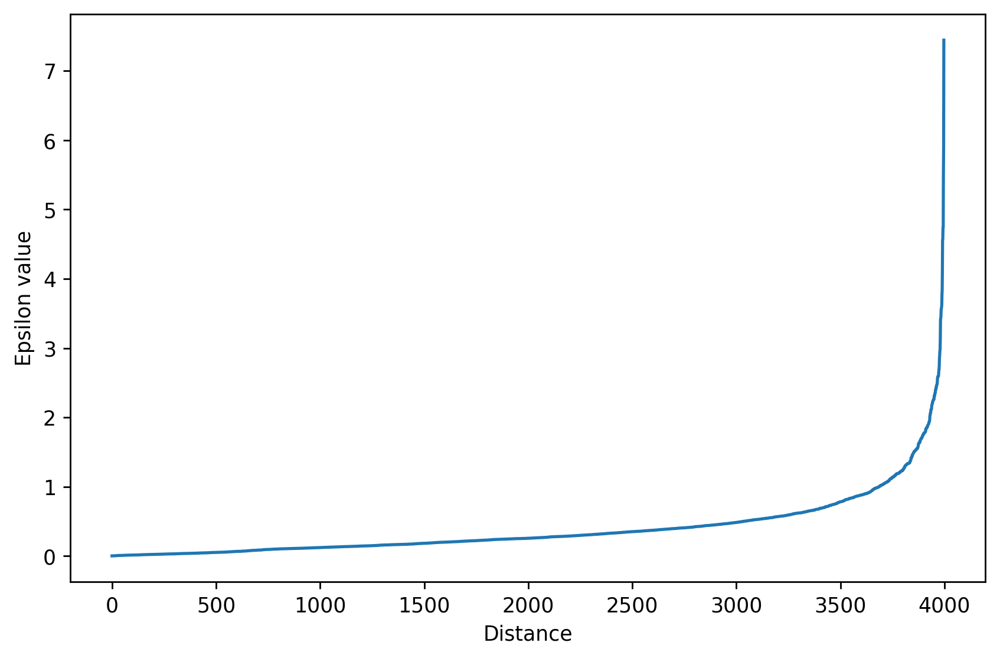

In [52]:
dist = np.sort(d[:,1])
plt.plot(dist)
plt.xlabel('Distance')
plt.ylabel('Epsilon value')

In [53]:
db = DBSCAN(eps=2,min_samples=3)
y1pred = db.fit_predict(dfs)
y1pred

array([0, 0, 0, ..., 1, 0, 0], dtype=int64)

In [54]:
silhouette_score(dfs,y1pred)

0.2869960499860212